# AutoML and SHAP for RCC urine biomarkers

Olatomiwa O. Bifarin

## Table of Contents
<a id="0"></a>
- [The Datasets](#1) <br>
- [ML Classifiers](#2) <br>
- [AutoML with autosklearn](#3)<br>
- [Confusion Matrix](#4)<br>
- [SHAP Analysis](#5)<br>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import sklearn
import autosklearn
import lime
import shap
import openpyxl
import PipelineProfiler

#To ignore warning
import warnings
warnings.filterwarnings('ignore')

In [2]:
# numpy random seed.
np.random.seed(42)

## The Dataset
<a id="1"></a>

**Load and transform metabolomic dataset**

In [3]:
train_cohort = pd.read_excel('data/RCC_train_dataframe.xlsx')

In [4]:
train_cohort.head()

,hippurate-mannitol,Dibutylamine,hippuric acid,2-mercaptobenzothiazole,N-acetyl-glucosaminic acid,2-phenylacetamide,lys-Ile/lys-leu,Groups
0,3.800828e+06,51941.621700,21718.888030,13702.776060,109106.362391,7.108177e+06,9.556435e+05,0
1,3.516090e+06,362606.040476,67941.163070,78157.142221,300268.835200,5.124477e+06,1.402297e+06,1
2,6.431969e+05,104382.252294,19009.797187,1693.109469,42199.831666,3.812771e+06,2.689574e+03,0
3,7.281759e+05,81069.723681,45840.760919,1474.578607,135713.061180,5.615746e+06,1.794539e+04,0
4,6.457731e+03,309202.627175,445.362685,9147.539425,935.025788,2.728579e+05,6.660376e+04,1


In [5]:
# Separate target and features
target = "Groups" # Replace with your target column name.
X_train = train_cohort.drop(target, axis=1)
X_train =(X_train - X_train.mean(axis=0))/X_train.std(axis=0) #autoscaling
y_train = train_cohort[target]

In [6]:
print(f"There are {y_train.tolist().count(0)} healthy controls samples") 
print(f"There are {y_train.tolist().count(1)} RCC samples")

There are 140 healthy controls samples
There are 64 RCC samples


In [7]:
X_train.head()

,hippurate-mannitol,Dibutylamine,hippuric acid,2-mercaptobenzothiazole,N-acetyl-glucosaminic acid,2-phenylacetamide,lys-Ile/lys-leu
0,1.785974,-0.551343,0.199571,-0.074443,-0.296218,1.925620,0.311555
1,1.586772,1.334980,2.069200,0.917716,0.923021,1.002573,0.883304
2,-0.423095,-0.232929,0.089992,-0.259311,-0.722950,0.392216,-0.908297
3,-0.363644,-0.374480,1.175269,-0.262674,-0.126520,1.231168,-0.888768
4,-0.868556,1.010720,-0.660915,-0.144563,-0.986138,-1.254962,-0.826482


**Load test set**

In [8]:
test_cohort = pd.read_excel('data/RCC_test_dataframe.xlsx')
X_test = test_cohort.drop(target, axis=1)
X_test =(X_test - X_test.mean(axis=0))/X_test.std(axis=0) #autoscaling
y_test = test_cohort[target]

In [9]:
y_test.value_counts()

Groups
0    34
1    18
Name: count, dtype: int64

### [table of contents](#0)

## ML Classifiers
<a id="2"></a>

**Evaluate Model: Function for the training dataset.**

In [62]:
from sklearn.metrics import make_scorer, confusion_matrix, roc_auc_score
from sklearn.model_selection import cross_val_score, cross_val_predict

def sensitivity_score(y_true, y_pred):
    TN, FP, FN, TP = confusion_matrix(y_true, y_pred).ravel()
    return TP / (TP + FN)

def specificity_score(y_true, y_pred):
    TN, FP, FN, TP = confusion_matrix(y_true, y_pred).ravel()
    return TN / (TN + FP)

def evaluate_model_train(estimator, X_train, y_train):
    # AUC score
    auc_scores = cross_val_score(estimator, 
                                 X_train, 
                                 y_train,
                                 scoring='roc_auc',
                                 cv=5, n_jobs=-1)
    
    # Accuracy score
    accuracy_scores = cross_val_score(estimator, 
                                      X_train, 
                                      y_train,
                                      scoring='accuracy',
                                      cv=5, n_jobs=-1)
    
    # Sensitivity score
    sensitivity_scores = cross_val_score(estimator, 
                                         X_train, 
                                         y_train,
                                         scoring=make_scorer(sensitivity_score),
                                         cv=5, n_jobs=-1)
    
    # Specificity score
    specificity_scores = cross_val_score(estimator, 
                                         X_train, 
                                         y_train,
                                         scoring=make_scorer(specificity_score),
                                         cv=5, n_jobs=-1)
    
    results = {
        "AUC": {
            "mean": auc_scores.mean(),
            "std": auc_scores.std()
        },
        "Accuracy": {
            "mean": accuracy_scores.mean(),
            "std": accuracy_scores.std()
        },
        "Sensitivity": {
            "mean": sensitivity_scores.mean(),
            "std": sensitivity_scores.std()
        },
        "Specificity": {
            "mean": specificity_scores.mean(),
            "std": specificity_scores.std()
        }
    }
    
    return results

**Evaluate Model: function for the test dataset.**

In [63]:
from sklearn.metrics import roc_curve, auc, confusion_matrix

def evaluate_test_set(model, X_train, y_train, X_test, y_test):
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Make predictions on the test data
    preds = model.predict_proba(X_test)

    # Calculate the test set ROC AUC
    test_roc_auc = round(roc_auc_score(y_test, preds[:, 1]), 2)

    # Get the predicted classes for the test data
    pred_classes = model.predict(X_test)

    # Calculate the confusion matrix for the test data
    cm = confusion_matrix(y_test, pred_classes)

    # Calculate sensitivity and specificity for the test data
    TN, FP, FN, TP = cm.ravel()
    sensitivity = TP / (TP + FN)
    specificity = TN / (TN + FP)

    # Calculate accuracy for the test data
    accuracy = (TP + TN) / (TP + TN + FP + FN)

    results = {
        "AUC": test_roc_auc,
        "Confusion Matrix": cm,
        "Sensitivity": sensitivity,
        "Specificity": specificity,
        "Accuracy": accuracy
    }
    
    return results

**Random Forest Classifier**

In [92]:
from sklearn.ensemble import RandomForestClassifier
# Random forest:
RF = RandomForestClassifier(random_state=42)
results = evaluate_model_train(RF, X_train, y_train)
print("Random Forest Train ROC AUC: %0.2f +/- %0.2f" % (results["AUC"]["mean"], results["AUC"]["std"]))
print("Random Forest Train Accuracy: %0.2f +/- %0.2f" % (results["Accuracy"]["mean"], results["Accuracy"]["std"]))
print("Random Forest Train Sensitivity: %0.2f +/- %0.2f" % (results["Sensitivity"]["mean"], results["Sensitivity"]["std"]))
print("Random Forest Train Specificity: %0.2f +/- %0.2f" % (results["Specificity"]["mean"], results["Specificity"]["std"]))

Random Forest Train ROC AUC: 0.97 +/- 0.03
Random Forest Train Accuracy: 0.95 +/- 0.03
Random Forest Train Sensitivity: 0.88 +/- 0.06
Random Forest Train Specificity: 0.99 +/- 0.03


In [126]:
results = evaluate_test_set(RF, X_train, y_train, X_test, y_test)
print("Random Forest ROC AUC for Test Set: %0.2f" % results["AUC"])
print("Random Forest Accuracy for Test Set: %0.2f" % results["Accuracy"])
print("Random Forest Sensitivity for Test Set: %0.2f" % results["Sensitivity"])
print("Random Forest Specificity for Test Set: %0.2f" % results["Specificity"])
print("Random Forest Confusion Matrix for Test Set:")
print(results["Confusion Matrix"])

Random Forest ROC AUC for Test Set: 0.95
Random Forest Accuracy for Test Set: 0.90
Random Forest Sensitivity for Test Set: 0.83
Random Forest Specificity for Test Set: 0.94
Random Forest Confusion Matrix for Test Set:
[[32  2]
 [ 3 15]]


**SVM**

In [94]:
from sklearn.svm import SVC

# Create a SVC object
svm = SVC(random_state=42, probability=True)
results = evaluate_model_train(svm, X_train, y_train)
print("SVM Train ROC AUC: %0.2f +/- %0.2f" % (results["AUC"]["mean"], results["AUC"]["std"]))
print("SVM Train Accuracy: %0.2f +/- %0.2f" % (results["Accuracy"]["mean"], results["Accuracy"]["std"]))
print("SVM Train Sensitivity: %0.2f +/- %0.2f" % (results["Sensitivity"]["mean"], results["Sensitivity"]["std"]))
print("SVM Train Specificity: %0.2f +/- %0.2f" % (results["Specificity"]["mean"], results["Specificity"]["std"]))

SVM Train ROC AUC: 0.97 +/- 0.03
SVM Train Accuracy: 0.92 +/- 0.03
SVM Train Sensitivity: 0.77 +/- 0.08
SVM Train Specificity: 0.99 +/- 0.01


In [127]:
results = evaluate_test_set(svm, X_train, y_train, X_test, y_test)
print("SVM ROC AUC for Test Set: %0.2f" % results["AUC"])
print("SVM Accuracy for Test Set: %0.2f" % results["Accuracy"])
print("SVM Sensitivity for Test Set: %0.2f" % results["Sensitivity"])
print("SVM Specificity for Test Set: %0.2f" % results["Specificity"])
print("SVM Confusion Matrix for Test Set:")
print(results["Confusion Matrix"])

SVM ROC AUC for Test Set: 0.93
SVM Accuracy for Test Set: 0.90
SVM Sensitivity for Test Set: 0.83
SVM Specificity for Test Set: 0.94
SVM Confusion Matrix for Test Set:
[[32  2]
 [ 3 15]]


**k-NN**

In [118]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNeighborsClassifier object
knn = KNeighborsClassifier()
results = evaluate_model_train(knn, X_train, y_train)
print("kNN Train ROC AUC: %0.2f +/- %0.2f" % (results["AUC"]["mean"], results["AUC"]["std"]))
print("kNN Train Accuracy: %0.2f +/- %0.2f" % (results["Accuracy"]["mean"], results["Accuracy"]["std"]))
print("kNN Train Sensitivity: %0.2f +/- %0.2f" % (results["Sensitivity"]["mean"], results["Sensitivity"]["std"]))
print("kNN Train Specificity: %0.2f +/- %0.2f" % (results["Specificity"]["mean"], results["Specificity"]["std"]))

kNN Train ROC AUC: 0.96 +/- 0.04
kNN Train Accuracy: 0.94 +/- 0.04
kNN Train Sensitivity: 0.83 +/- 0.09
kNN Train Specificity: 0.99 +/- 0.01


/usr/local/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/usr/local/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to Tr

In [128]:
results = evaluate_test_set(knn, X_train, y_train, X_test, y_test)
print("knn ROC AUC for Test Set: %0.2f" % results["AUC"])
print("knn Accuracy for Test Set: %0.2f" % results["Accuracy"])
print("knn Sensitivity for Test Set: %0.2f" % results["Sensitivity"])
print("knn Specificity for Test Set: %0.2f" % results["Specificity"])
print("knn Confusion Matrix for Test Set:")
print(results["Confusion Matrix"])

knn ROC AUC for Test Set: 0.93
knn Accuracy for Test Set: 0.87
knn Sensitivity for Test Set: 0.78
knn Specificity for Test Set: 0.91
knn Confusion Matrix for Test Set:
[[31  3]
 [ 4 14]]


### [table of contents](#0)

## AutoML with `autosklearn`
<a id="3"></a>

### load model

In [14]:
import pickle

#'askl_RCC_3600.pkl'or 'askl_RCC_600.pkl'
model_filename = 'askl_RCC_600.pkl'

# Load the model from the file
with open(model_filename, 'rb') as model_file:
    loaded_model = pickle.load(model_file)

In [15]:
import autosklearn.classification
import autosklearn.metrics

**Skip the next code snippet if loading model**

In [16]:
# Create and train an ensemble with AutoML 
#estimator_askl = autosklearn.classification.AutoSklearnClassifier(
#    time_left_for_this_task=7200,
#    seed=42, 
#    n_jobs=4,
#    resampling_strategy='cv',
#    metric=autosklearn.metrics.roc_auc,
#)

In [17]:
# Auto-sklearn ingests the pandas dataframe and detects column types
#estimator_askl.fit(X_train, y_train)

**Continue here**

In [18]:
estimator_askl = loaded_model

In [19]:
estimator_askl 

AutoSklearnClassifier(ensemble_class=<class 'autosklearn.ensembles.ensemble_selection.EnsembleSelection'>,
                      metric=roc_auc, n_jobs=4, per_run_time_limit=240,
                      resampling_strategy='cv', seed=42,
                      time_left_for_this_task=600)

### autosklearn parameters

These are the paremeters used for the autosklearn object.

In [20]:
#get the model params
estimator_askl.get_params() 

{'allow_string_features': True,
 'dask_client': None,
 'dataset_compression': True,
 'delete_tmp_folder_after_terminate': True,
 'disable_evaluator_output': False,
 'ensemble_class': autosklearn.ensembles.ensemble_selection.EnsembleSelection,
 'ensemble_kwargs': None,
 'ensemble_nbest': 50,
 'ensemble_size': None,
 'exclude': None,
 'get_smac_object_callback': None,
 'get_trials_callback': None,
 'include': None,
 'initial_configurations_via_metalearning': 25,
 'load_models': True,
 'logging_config': None,
 'max_models_on_disc': 50,
 'memory_limit': 3072,
 'metadata_directory': None,
 'metric': roc_auc,
 'n_jobs': 4,
 'per_run_time_limit': 240,
 'resampling_strategy': 'cv',
 'resampling_strategy_arguments': None,
 'scoring_functions': None,
 'seed': 42,
 'smac_scenario_args': None,
 'time_left_for_this_task': 600,
 'tmp_folder': None}

In this study, we utilized the auto-sklearn framework, an automated machine learning tool. This tool offers various parameters to customize the performance and behavior of the machine learning model fitting process. In this section, we provide an outline of the configuration parameters we employed for the auto-sklearn estimator in this experiment.

`allow_string_features`: This parameter was set to True, enabling the use of string features in the data preprocessing pipeline.

`dask_client`: No Dask distributed computing client was utilized, as indicated by the None value for this parameter.

`dataset_compression`: The compression of datasets was allowed with this parameter set to True.

`delete_tmp_folder_after_terminate`: This was set to True, implying that temporary folders used during the machine learning process are deleted after termination.

`disable_evaluator_output`: This parameter was set to False, allowing the output of the evaluator function.

`ensemble_class`: The ensemble method used was autosklearn.ensembles.ensemble_selection.EnsembleSelection.

`ensemble_nbest`: The value of 50 indicates that the best 50 models were included in the ensemble.

`load_models`: Models were loaded after being saved to the disk, as shown by this parameter's True value.

`initial_configurations_via_metalearning`: The meta-learning configurations were set to 25, which enabled the system to learn from the meta-data of previously evaluated configurations.

`max_models_on_disc`: A total of 50 models were allowed to be stored on disk during the model fitting process.

`memory_limit`: The memory limit was set to 3072 MB, which was the maximum amount of memory that the auto-sklearn process was allowed to use.

`metric`: The evaluation metric utilized for this task was roc_auc which stands for Receiver Operating Characteristic Area Under the Curve.

`n_jobs`: The total number of jobs running in parallel was set to 4.

`per_run_time_limit`: The maximum amount of time (in seconds) for a single call to the machine learning model was set to 240 seconds.

`resampling_strategy`: The resampling strategy employed was cross-validation (cv).

`seed`: The seed for the pseudo-random number generator used to initialize the modeling was set to 42.

`time_left_for_this_task`: The overall time budget was set to 600 seconds.

### sprint statistics

In [21]:
print(estimator_askl.sprint_statistics())

auto-sklearn results:
  Dataset name: 7547ecf2-e373-11ed-8f0e-0242ac110002
  Metric: roc_auc
  Best validation score: 0.983373
  Number of target algorithm runs: 289
  Number of successful target algorithm runs: 285
  Number of crashed target algorithm runs: 2
  Number of target algorithms that exceeded the time limit: 2
  Number of target algorithms that exceeded the memory limit: 0



### ensemble: model weights

The `get_model_weights()` function in AutoSklearn is used to retrieve the weights of all models included in the final ensemble

In [22]:
#get the model weights
estimator_askl.get_models_with_weights()

[(0.2,
  SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'libsvm_svc', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'random_trees_embedding', 'classifier:libsvm_svc:C': 2307.5935104184055, 'classifier:libsvm_svc:gamma': 0.9335706907623043, 'classifier:libsvm_svc:kernel': 'poly', 'classifier:libsvm_svc:max_iter': -1, 'classifier:libsvm_svc:shrinking': 'False', 'classifier:libsvm_svc:tol': 2.513898786636789e-05, 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'median', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'power_transformer', 'feature_preprocessor:random_trees_embedding:bootstrap': 'False', 'feature_preprocessor:random_trees_embedding:max_depth': 9, 'feature_preprocessor:random_trees_embedding:max_leaf_nodes': 'None', 'feature_preprocessor:random_trees_embedding:min_samples_leaf': 3, 'feature_preprocessor:random_trees_embedding:min_samples_sp

In [23]:
model_with_weights = estimator_askl.get_models_with_weights()
print(f"The number of models in the final ensemble is: {len(model_with_weights)}")

The number of models in the final ensemble is: 13


**The ensemble**: leaderboard

In [24]:
estimator_askl.leaderboard()

,rank,ensemble_weight,type,cost,duration
model_id,,,,,
67,1,0.02,liblinear_svc,0.017211,1.686285
268,2,0.14,libsvm_svc,0.018008,1.230274
208,3,0.02,libsvm_svc,0.019325,1.730501
285,4,0.08,libsvm_svc,0.019325,1.705604
252,5,0.08,libsvm_svc,0.019356,1.456847
218,6,0.04,libsvm_svc,0.020429,1.574786
115,7,0.12,gradient_boosting,0.022638,1.510414
114,8,0.02,gradient_boosting,0.023742,1.941538
26,9,0.20,libsvm_svc,0.024514,2.482578


`Leaderboard() Simple`:
- `model_id` - The id given to a model by autosklearn.
- `rank` - The rank of the model based on it’s "cost".
- `ensemble_weight` - The weight given to the model in the ensemble.
- `type` - The type of classifier/regressor used.
- `cost` - The loss of the model on the validation set.
- `duration` - Length of time the model was optimized for.

In [25]:
model_leadership = estimator_askl.leaderboard(detailed=True, 
                                     ensemble_only=True, 
                                     sort_order="descending")
model_leadership

,rank,ensemble_weight,type,cost,duration,config_id,train_loss,seed,start_time,end_time,budget,status,data_preprocessors,feature_preprocessors,balancing_strategy,config_origin
model_id,,,,,,,,,,,,,,,,
67,1,0.02,liblinear_svc,0.017211,1.686285,66,0.000000e+00,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[nystroem_sampler],weighting,Random Search (sorted)
268,2,0.14,libsvm_svc,0.018008,1.230274,267,5.222559e-05,0,1.682433e+09,1.682433e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],none,Local Search
208,3,0.02,libsvm_svc,0.019325,1.730501,207,0.000000e+00,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Random Search (sorted)
285,4,0.08,libsvm_svc,0.019325,1.705604,284,0.000000e+00,0,1.682433e+09,1.682433e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Local Search
252,5,0.08,libsvm_svc,0.019356,1.456847,251,1.197645e-02,0,1.682433e+09,1.682433e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Local Search
218,6,0.04,libsvm_svc,0.020429,1.574786,217,2.289823e-02,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Local Search
115,7,0.12,gradient_boosting,0.022638,1.510414,114,0.000000e+00,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search
114,8,0.02,gradient_boosting,0.023742,1.941538,113,0.000000e+00,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[feature_agglomeration],none,Local Search
26,9,0.20,libsvm_svc,0.024514,2.482578,25,2.217725e-17,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Random Search


Detailed: The detailed view includes all of the simple statistics along with the following.

- `config_id` - The id used by SMAC for optimization.
- `budget` - How much budget was allocated to this model. 
- `status` - The return status of training the model with SMAC.
- `train_loss` - The loss of the model on the training set. 
- `balancing_strategy` - The balancing strategy used for data preprocessing.
- `start_time` - Time the model began being optimized 
- `end_time` - Time the model ended being optimized
- `data_preprocessors` - The preprocessors used on the data *
- `feature_preprocessors` - The preprocessors for features types

Includes all models and not only those that make it to the ensemble. 

In [26]:
model_leadership = estimator_askl.leaderboard(detailed=True, 
                                     ensemble_only=False, 
                                     sort_order="descending")
model_leadership

,rank,ensemble_weight,type,cost,duration,config_id,train_loss,seed,start_time,end_time,budget,status,data_preprocessors,feature_preprocessors,balancing_strategy,config_origin
model_id,,,,,,,,,,,,,,,,
271,2,0.00,libsvm_svc,0.016627,1.639356,270,0.000000,0,1.682433e+09,1.682433e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Local Search
282,1,0.00,libsvm_svc,0.016627,1.578077,281,0.000000,0,1.682433e+09,1.682433e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Local Search
67,3,0.02,liblinear_svc,0.017211,1.686285,66,0.000000,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[nystroem_sampler],weighting,Random Search (sorted)
268,4,0.14,libsvm_svc,0.018008,1.230274,267,0.000052,0,1.682433e+09,1.682433e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],none,Local Search
208,5,0.02,libsvm_svc,0.019325,1.730501,207,0.000000,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[random_trees_embedding],weighting,Random Search (sorted)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,271,0.00,liblinear_svc,0.500000,2.048478,175,0.000592,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[nystroem_sampler],weighting,Local Search
202,282,0.00,bernoulli_nb,0.500552,1.838885,201,0.491301,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[select_percentile_classification],none,Random Search
71,283,0.00,sgd,0.618801,1.805699,70,0.564729,0,1.682432e+09,1.682432e+09,0.0,StatusType.SUCCESS,[],[extra_trees_preproc_for_classification],none,Random Search


### show models

In [27]:
print(estimator_askl.show_models())

{26: {'model_id': 26, 'rank': 1, 'cost': 0.024514292896645817, 'ensemble_weight': 0.2, 'voting_model': VotingClassifier(estimators=None, voting='soft'), 'estimators': [{'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0xffff589949a0>, 'balancing': Balancing(random_state=42, strategy='weighting'), 'feature_preprocessor': <autosklearn.pipeline.components.feature_preprocessing.FeaturePreprocessorChoice object at 0xffff58a03f40>, 'classifier': <autosklearn.pipeline.components.classification.ClassifierChoice object at 0xffff58c04a00>, 'sklearn_classifier': SVC(C=2307.5935104184055, cache_size=1966.4973958333333,
    class_weight='balanced', coef0=-0.447625155175851, degree=4,
    gamma=0.9335706907623043, kernel='poly', max_iter=-1.0, random_state=42,
    shrinking=False, tol=2.513898786636789e-05)}, {'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0xffff59182f70>, 'balancing':

### pipeline profiler

In [28]:
profiler_data = PipelineProfiler.import_autosklearn(estimator_askl)

In [29]:
PipelineProfiler.plot_pipeline_matrix(profiler_data)

**Focusing on the ensemble model**

To get the subset ensemble model, rank the pipeline matrix above with ensemble weight, and then select the ML pipeline with a corresponding non-zero weight. And click on `export` to export selected pipeline. Once done, run the code below.

See tutorial for more: https://www.youtube.com/watch?v=2WSYoaxLLJ8

In [ ]:
PipelineProfiler.get_exported_pipelines()

In [ ]:
ensemble_subset = PipelineProfiler.get_exported_pipelines()

In [ ]:
PipelineProfiler.plot_pipeline_matrix(ensemble_subset)

### performance over time

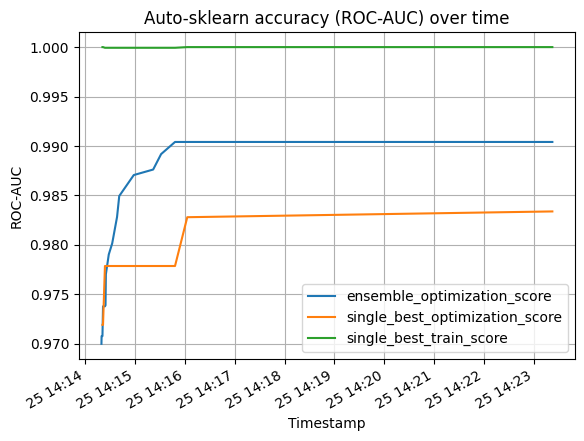

In [111]:
# Assuming you have already instantiated an AutoSklearnClassifier as estimator_askl
poT = estimator_askl.performance_over_time_

ax = poT.plot(
    x="Timestamp",
    kind="line",
    legend=True,
    title="Auto-sklearn accuracy (ROC-AUC) over time",
    grid=True,
)

# Set labels for x-axis and y-axis
ax.set_xlabel("Timestamp")
ax.set_ylabel("ROC-AUC")

# Save the plot to an SVG file
#plt.savefig("performance_over_time_plot.svg", bbox_inches="tight", dpi=300)

# Display the plot
plt.show()

In [113]:
# For compatibility with scikit-learn we implement `cv_results_`
#print(estimator_askl.cv_results_)

**ML performance in training and test set**

In [120]:
estimator_askl

AutoSklearnClassifier(ensemble_class=<class 'autosklearn.ensembles.ensemble_selection.EnsembleSelection'>,
                      metric=roc_auc, n_jobs=4, per_run_time_limit=240,
                      resampling_strategy='cv', seed=42,
                      time_left_for_this_task=600)

**Training**

In [121]:
results = evaluate_model_train(estimator_askl, X_train, y_train)
print("askl Train ROC AUC: %0.2f +/- %0.2f" % (results["AUC"]["mean"], results["AUC"]["std"]))
print("askl Train Accuracy: %0.2f +/- %0.2f" % (results["Accuracy"]["mean"], results["Accuracy"]["std"]))
print("askl Train Sensitivity: %0.2f +/- %0.2f" % (results["Sensitivity"]["mean"], results["Sensitivity"]["std"]))
print("askl Train Specificity: %0.2f +/- %0.2f" % (results["Specificity"]["mean"], results["Specificity"]["std"]))

/usr/local/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 42457 instead
  warnings.warn(
/usr/local/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 33057 instead
  warnings.warn(
/usr/local/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36623 instead
  warnings.warn(
/usr/local/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34963 instead
  warnings.warn(
/usr/local/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running

askl Train ROC AUC: 0.97 +/- 0.03
askl Train Accuracy: 0.96 +/- 0.02
askl Train Sensitivity: 0.88 +/- 0.06
askl Train Specificity: 0.99 +/- 0.02


In [140]:
""" 
autosklearn_scores = cross_val_score(estimator_askl, 
                         X_train, 
                         y_train,
                         scoring = 'roc_auc',
                         cv=5, n_jobs=-1)
""";

In [141]:
"""
#print(scores)
print("AutoML ROC AUC: %0.2f +/- %0.2f" % (autosklearn_scores.mean(), 
                                           autosklearn_scores.std()))                                           
""";

**Test**

In [65]:
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix

# ROC score
prediction = estimator_askl.predict_proba(X_test)
roc_askl = roc_auc_score(y_test, prediction[:, 1])
print("AutoML ROC-AUC test set: %0.2f" %(roc_askl))

# Accuracy
y_pred = estimator_askl.predict(X_test)
acc_askl = accuracy_score(y_test, y_pred)
print("AutoML Accuracy test set: %0.2f" %(acc_askl))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f"AutoML confusion matrix: {cm}")

# Sensitivity and Specificity
TN, FP, FN, TP = cm.ravel()
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"AutoML Sensitivity test set: {sensitivity:.2f}")
print(f"AutoML Specificity test set: {specificity:.2f}")

AutoML ROC-AUC test set: 0.97
AutoML Accuracy test set: 0.90
AutoML confusion matrix: [[31  3]
 [ 2 16]]
AutoML Sensitivity test set: 0.89
AutoML Specificity test set: 0.91


In [138]:
""" results = evaluate_test_set(estimator_askl, X_train, y_train, X_test, y_test)
print("askl ROC AUC for Test Set: %0.2f" % results["AUC"])
print("askl Accuracy for Test Set: %0.2f" % results["Accuracy"])
print("askl Sensitivity for Test Set: %0.2f" % results["Sensitivity"])
print("askl Specificity for Test Set: %0.2f" % results["Specificity"])
print("askl Confusion Matrix for Test Set:")
print(results["Confusion Matrix"])
""";

**Save autosklearn model**

In [ ]:
#import pickle
#model_filename = 'askl_RCC_3600.pkl'

# Save the model to a file
#with open(model_filename, 'wb') as model_file:
#    pickle.dump(estimator_askl, model_file)

### [table of contents](#0)

## Confusion Matrix
<a id="4"></a>

**Explaining true positives and true negatives**

In [66]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[31,  3],
       [ 2, 16]])

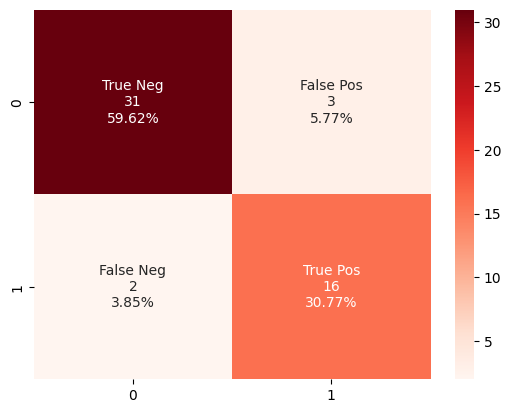

In [67]:
# Plot confusion matrix.

import seaborn as sns

group_names = ["True Neg","False Pos","False Neg","True Pos"]

group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cm, annot=labels, fmt='', cmap='Reds'); #Blues

In [68]:
# merging predicted samples with ground truth. 
list_of_tuples = list(zip(y_pred, y_test))
error_list = pd.DataFrame(list_of_tuples, 
                  columns = ['Prediction', 'Label'])
error_list.head()

,Prediction,Label
0,0,0
1,0,1
2,1,1
3,0,0
4,0,0


`0` is healthy control while `1` is RCC samples. 

**True Positive Samples: RCC samples classified as a RCC**

In [69]:
# True positive
tp = error_list.loc[(error_list['Prediction'] == 1) & (error_list['Label'] == 1)]
tp.head(4)

,Prediction,Label
2,1,1
8,1,1
9,1,1
15,1,1


In [70]:
# get the index as a list
tp_list = tp.index.tolist()

print(f"Theere are {len(tp_list)} true positives, and these are their indices: {tp_list}.")

Theere are 16 true positives, and these are their indices: [2, 8, 9, 15, 17, 18, 19, 21, 28, 31, 35, 36, 38, 45, 46, 47].


**False Negative Samples: RCC samples classified as Healthy**

In [71]:
# False Negative
fn = error_list.loc[(error_list['Prediction'] == 0) & (error_list['Label'] == 1)]
fn.head(4)

,Prediction,Label
1,0,1
37,0,1


In [72]:
# get the index as a list
fn_list = fn.index.tolist()

print(f"Theere are {len(fn_list)} false negatives, and these are their indices: {fn_list}.")

Theere are 2 false negatives, and these are their indices: [1, 37].


**True Negative Sample: Healthy controls classified as Healthy controls**

In [73]:
# True negative
tn = error_list.loc[(error_list['Prediction'] == 0) & (error_list['Label'] == 0)]
tn.head(4)

,Prediction,Label
0,0,0
3,0,0
4,0,0
5,0,0


In [74]:
# get the index as a list
tn_list = tn.index.tolist()

print(f"Theere are {len(tn_list)} true negatives, and these are their indices: {tn_list}.")

Theere are 31 true negatives, and these are their indices: [0, 3, 4, 5, 7, 10, 11, 12, 13, 14, 16, 20, 22, 23, 24, 25, 26, 27, 29, 30, 32, 33, 34, 39, 41, 42, 44, 48, 49, 50, 51].


**False Positive Samples: Healthy controls classified as RCC samples**

In [75]:
# False positive
fp = error_list.loc[(error_list['Prediction'] == 1) & (error_list['Label'] == 0)]
fp.head(4)

,Prediction,Label
6,1,0
40,1,0
43,1,0


In [76]:
# get the index as a list
fp_list = fp.index.tolist()

print(f"Theere are {len(fp_list)} false positive, and these are their indices: {fp_list}.")

Theere are 3 false positive, and these are their indices: [6, 40, 43].


### [table of contents](#0)

## SHAP Analysis
<a id="5"></a>

Check for high _correlation_ before using shap explainer.
See [text](https://mindfulmodeler.substack.com/p/correlation-can-ruin-interpretability)

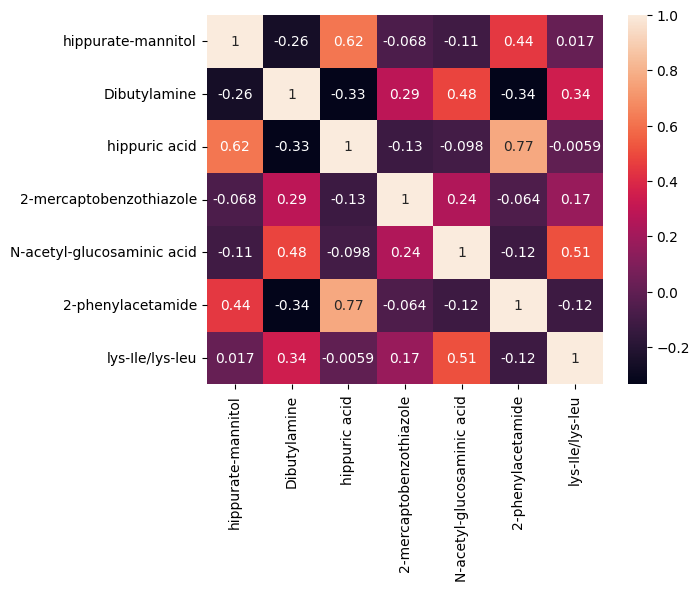

In [30]:
import seaborn as sns
correlation_matrix = X_test.corr()
sns.heatmap(correlation_matrix, annot=True);

Note from Perplexity: 

`"Using an explainer with a training sample and computing SHAP importance scores with a test set allows for more accurate feature importance values. This is because the explainer can be trained on the training sample, which is used to calculate Shapley values from game theory, and coefficients from a local linear regression. The test set is then used to compute the SHAP importance scores, which are sorted by feature importance in descending order"`

In [31]:
import shap
shap.initjs()

In [32]:
# Create a wrapper function for estimator_askl.predict_proba 
# that converts NumPy arrays back to pandas DataFrames:
def predict_proba_wrapper(X):
    X_df = pd.DataFrame(X, columns=X_train.columns)
    return estimator_askl.predict_proba(X_df)

In [33]:
#estimator_askl.predict_proba or just use the wrapper.

X_train_summary = shap.kmeans(X_train.values, 10)
# Model baseline: Use X_train_summary to summarize the training set or use whole train data.
explainer = shap.KernelExplainer(predict_proba_wrapper, X_train_summary, 
                                 link='identity', seed=42) #'logit?'

shap_values = explainer.shap_values(X_test.values, seed=42) #X_trainDF, X_testDF

  0%|          | 0/52 [00:00<?, ?it/s]

In [34]:
print(f'length of SHAP values: {len(shap_values)}')
print(f'Shape of each element: {shap_values[1].shape}')

length of SHAP values: 2
Shape of each element: (52, 7)


**SHAP Summary plot**

In [35]:
X_test.head()

,hippurate-mannitol,Dibutylamine,hippuric acid,2-mercaptobenzothiazole,N-acetyl-glucosaminic acid,2-phenylacetamide,lys-Ile/lys-leu
0,0.320079,-0.271701,-0.103120,-0.286003,-0.650904,0.955161,0.423949
1,-0.334503,-0.438091,0.017801,-0.111435,-0.746745,-0.034340,-0.515412
2,-0.151102,1.899110,-0.872327,3.401784,-0.508742,-0.892141,-0.976819
3,0.438436,-0.535329,2.399449,-0.397180,-0.451082,0.815724,-0.975887
4,-0.397801,0.146928,-0.030828,-0.425093,-1.010903,0.828887,-0.979653


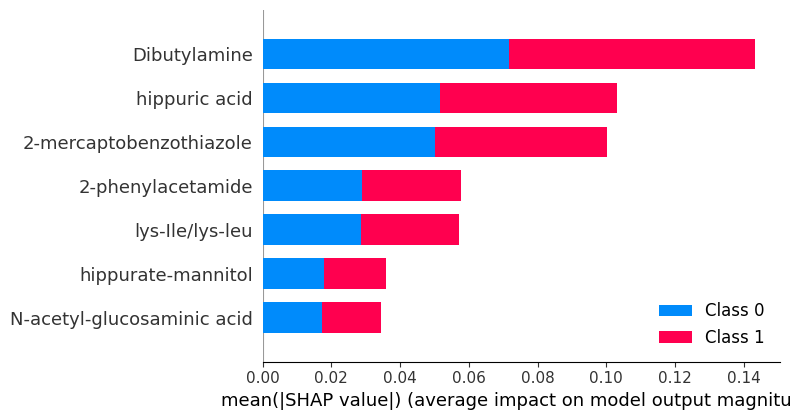

In [36]:
# summary plot
shap.summary_plot(shap_values, X_test)

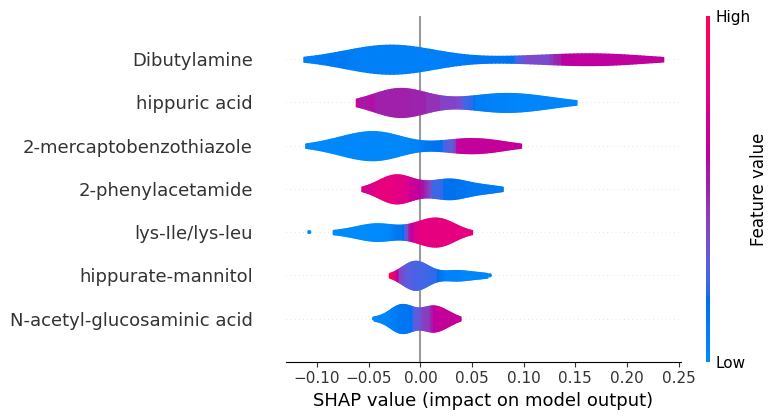

In [37]:
shap.summary_plot(shap_values[1], 
                  X_test, plot_type='violin', show=False)

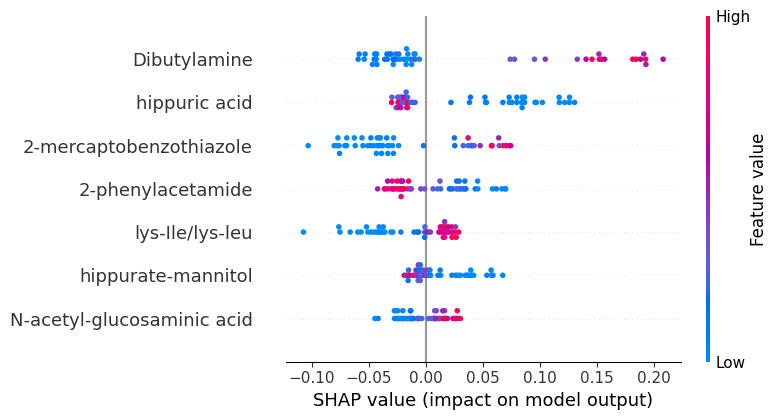

In [38]:
# summary plot
shap.summary_plot(shap_values[1], X_test)

In [39]:
# Save the summary plot as an SVG file
#shap.summary_plot(shap_values[1], X_test, show=False)
#plt.savefig("RCC_summary_shap.svg")
#plt.clf()  # Clear the figure

**SHAP feature importance: Global Importance**

Features with large absolute Shapley values are important. Global feature importance of each feature is computed as the mean absolute value for that feature over all the given samples.

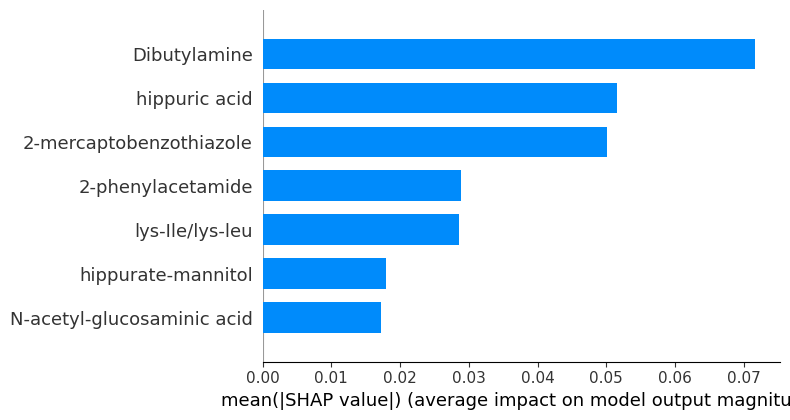

In [40]:
shap.summary_plot(shap_values[1], X_test, plot_type="bar", show='True')

In [41]:
# Save the summary plot as an SVG file
#shap.summary_plot(shap_values[1], X_test, plot_type="bar", show=False)
#plt.savefig("RCC_summary_shap_barplot.svg")
#plt.clf()  # Clear the figure

**SHAP feature importance: Local Importance**

Waterfall plots are designed to display local explanations i.e. for individual predictions. The bottom of a waterfall plot starts as the expected value of the model output, and then each row shows how the positive (red) or negative (blue) contribution of each feature moves the value from the expected model output over the background dataset to the model output for this prediction.

In [42]:
print(shap.__version__)

0.41.0


**True positive explanation**

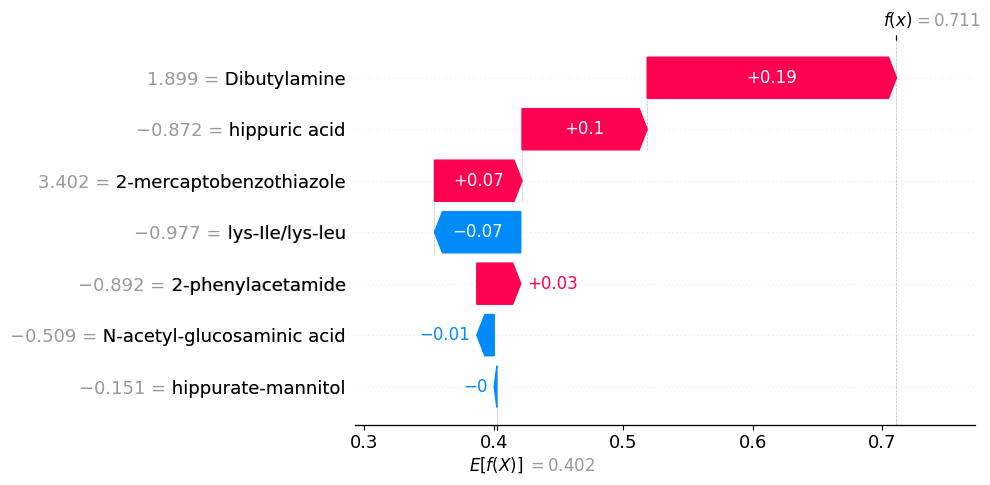

In [43]:
# Waterfall plot
sample_index = 2  # Choose the index of the instance you want to explain
shap_values_obj = shap.Explanation(values=shap_values[1][sample_index], 
                                   base_values=explainer.expected_value[1], 
                                   data=X_test.iloc[sample_index], 
                                   feature_names=X_test.columns)

shap.waterfall_plot(shap_values_obj)

In [44]:
#Save waterfall plot
#shap.waterfall_plot(shap_values_obj, show=False)
#plt.savefig("RCC_waterfall_shap_barplot_TP.svg")
#plt.clf()  # Clear the figure

**True negative explanation**

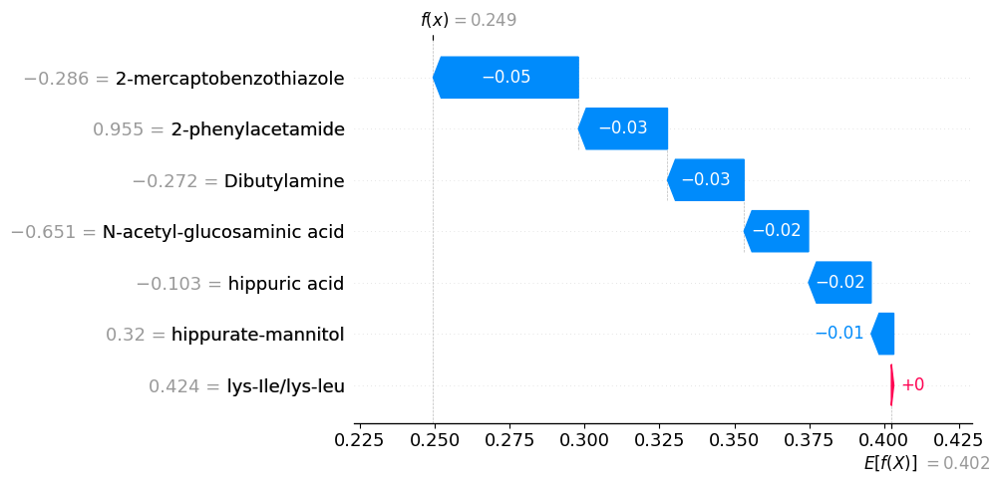

In [45]:
# Waterfall plot
sample_index = 0  # Choose the index of the instance you want to explain
shap_values_obj = shap.Explanation(values=shap_values[1][sample_index], 
                                   base_values=explainer.expected_value[1], 
                                   data=X_test.iloc[sample_index], 
                                   feature_names=X_test.columns)

shap.waterfall_plot(shap_values_obj)

In [46]:
#Save waterfall plot
#shap.waterfall_plot(shap_values_obj, show=False)
#plt.savefig("RCC_waterfall_shap_barplot_TN.svg")
#plt.clf()  # Clear the figure

**SHAP Heatmap**

It creates a plot with the instances on the x-axis, the model inputs on the y-axis, and the SHAP values encoded on a color scale. It tries to group the samples that have the same model output for the same reason getting grouped together.

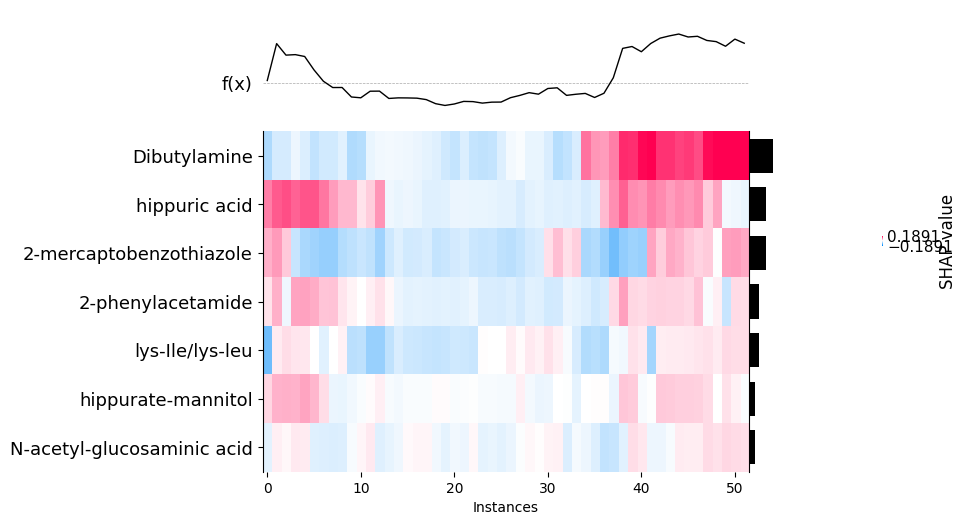

In [47]:
# SHAP heatmap
shap_values_obj_all = shap.Explanation(values=shap_values[1], 
                                       base_values=explainer.expected_value[1], 
                                       data=X_test, feature_names=X_test.columns)
shap.plots.heatmap(shap_values_obj_all)

**SHAP Force Plot**

In [48]:
#True positives
shap.initjs()

shap.force_plot(explainer.expected_value[1], 
                shap_values[1][2], 
                X_test.iloc[2,:])

In [49]:
#True negatives
shap.initjs()

shap.force_plot(explainer.expected_value[1], 
                shap_values[1][0], 
                X_test.iloc[0,:])

In [50]:
shap.initjs()
# visualize all the test set predictions
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test)

In [51]:
X_test.columns

Index(['hippurate-mannitol', 'Dibutylamine', 'hippuric acid',
       '2-mercaptobenzothiazole', 'N-acetyl-glucosaminic acid',
       '2-phenylacetamide', 'lys-Ile/lys-leu'],
      dtype='object')

**SHAP dependence plot**

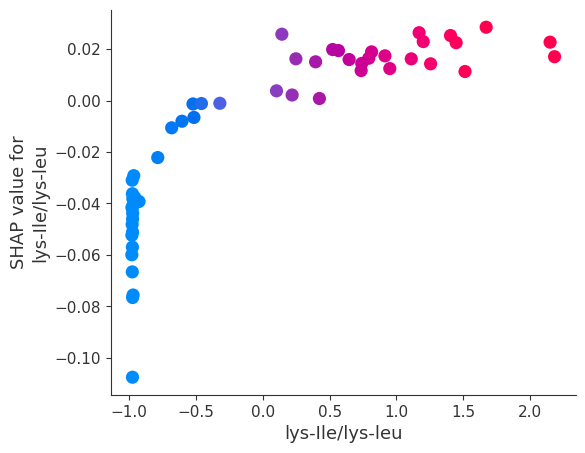

In [52]:
shap.initjs()
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('lys-Ile/lys-leu', 
                     shap_values[1], 
                     X_test, 
                     interaction_index = 'lys-Ile/lys-leu',
                     dot_size=90, show=False)

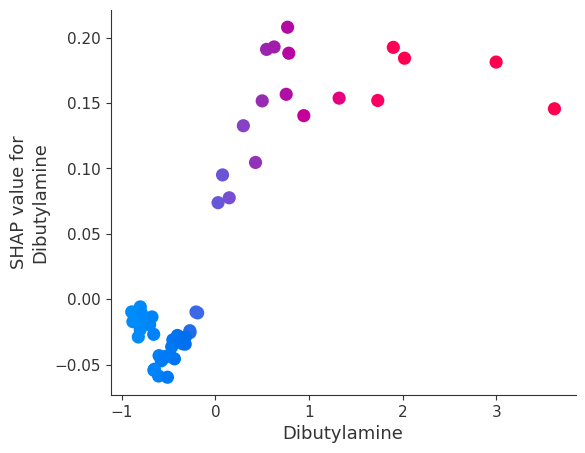

In [53]:
shap.initjs()
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot('Dibutylamine', 
                     shap_values[1], 
                     X_test, 
                     interaction_index = 'Dibutylamine',
                     dot_size=90, show=False)

A dependence plot between `hippuric acid` and `hippurate-mannitol deriviate`.

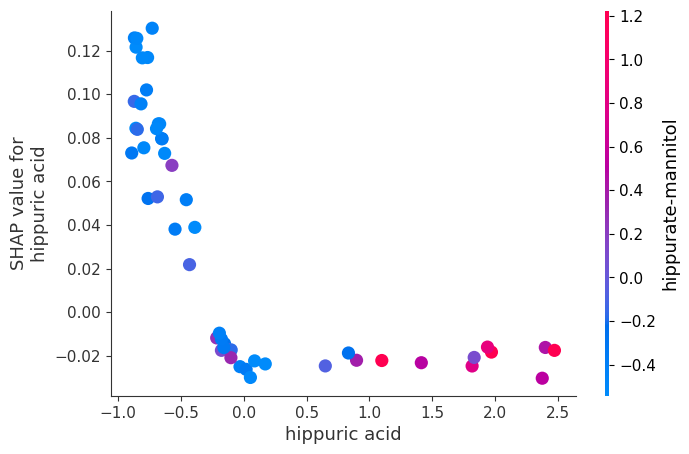

In [54]:
shap.initjs()
# dependence plot for hippuric acid and hippuric-mannitol derivative
shap.dependence_plot('hippuric acid', 
                     shap_values[1], 
                     X_test, 
                     interaction_index = 'hippurate-mannitol',
                     dot_size=90);

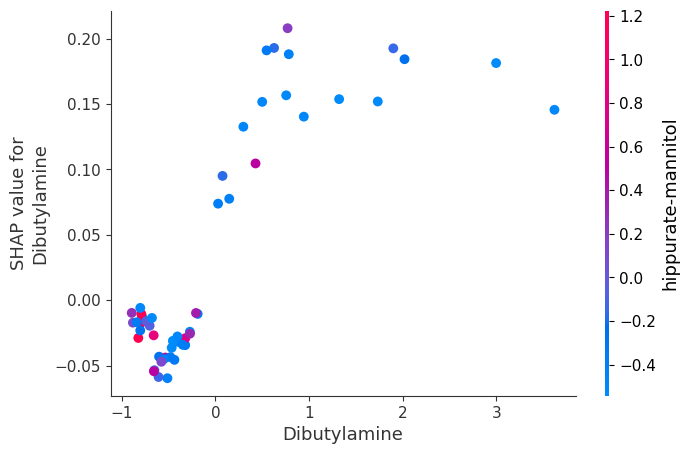

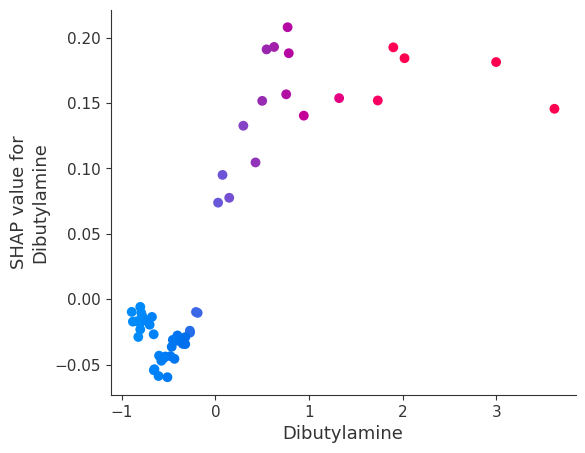

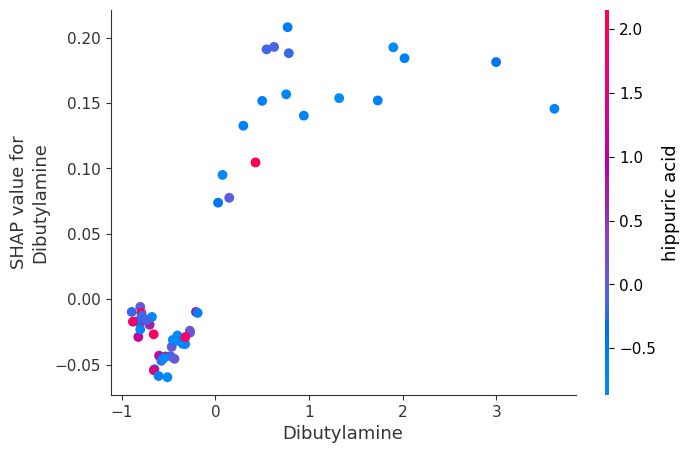

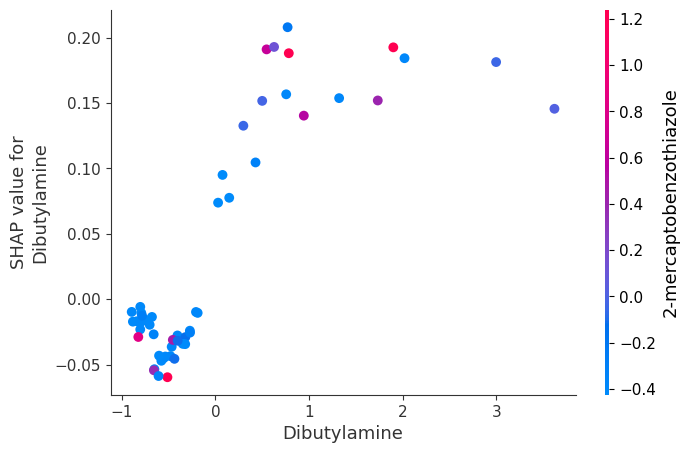

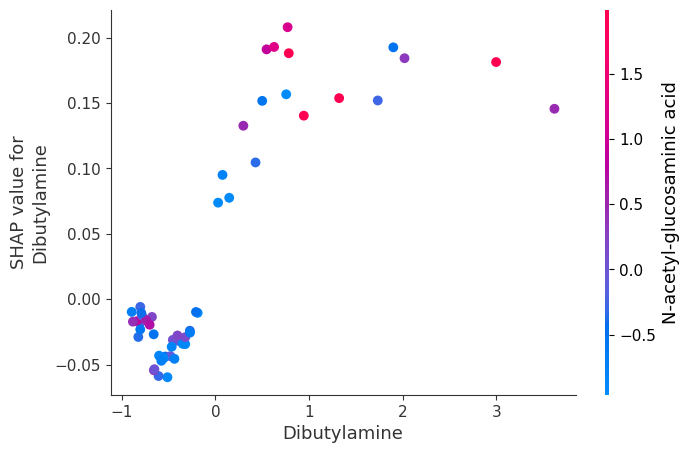

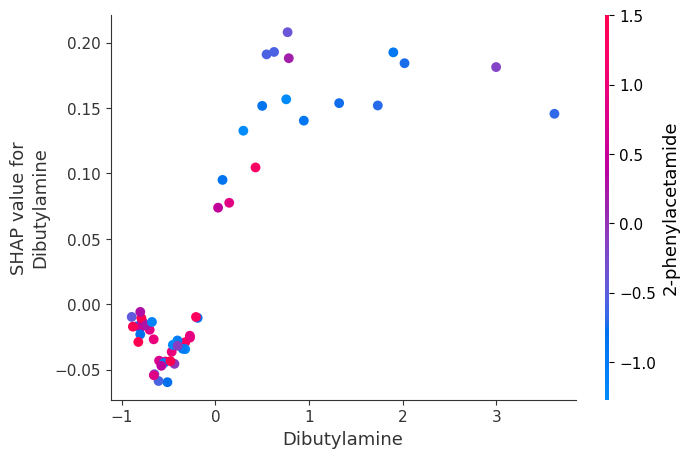

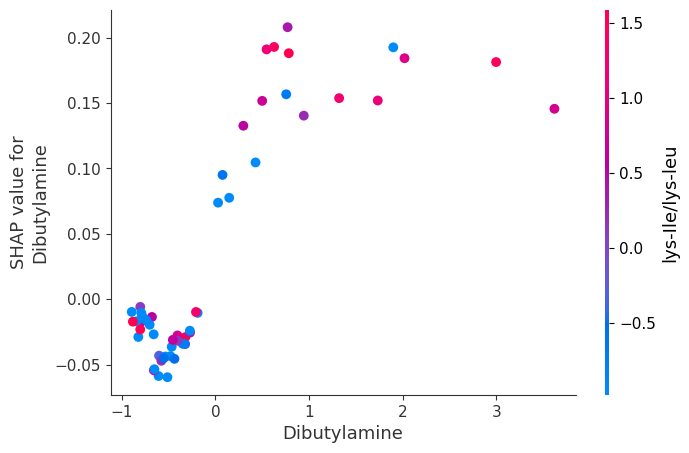

In [55]:
for name in X_test.columns:
  shap.dependence_plot('Dibutylamine', 
                     shap_values[1], 
                     X_test, 
                     interaction_index = name, dot_size=50)

**SHAP Embedding Plot**

In [56]:
X_test.columns

Index(['hippurate-mannitol', 'Dibutylamine', 'hippuric acid',
       '2-mercaptobenzothiazole', 'N-acetyl-glucosaminic acid',
       '2-phenylacetamide', 'lys-Ile/lys-leu'],
      dtype='object')

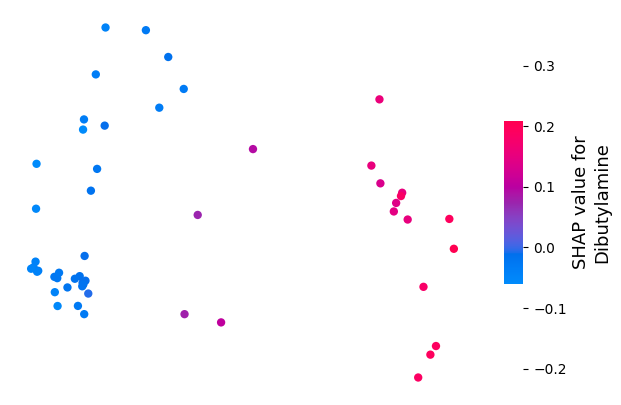

In [57]:
shap.embedding_plot("Dibutylamine", 
                    shap_values[1], feature_names = X_test.columns)

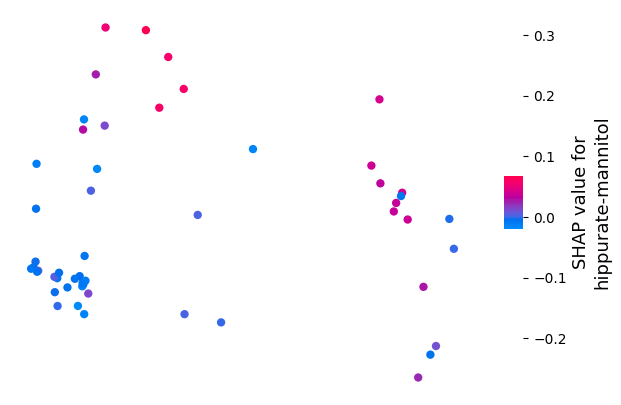

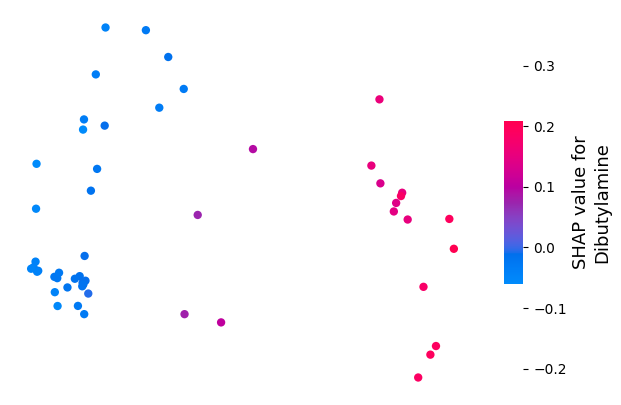

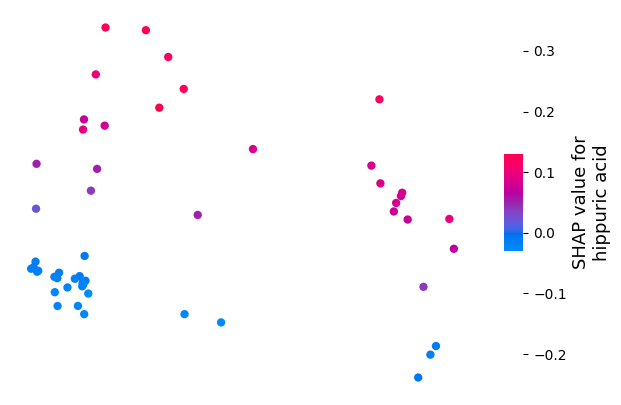

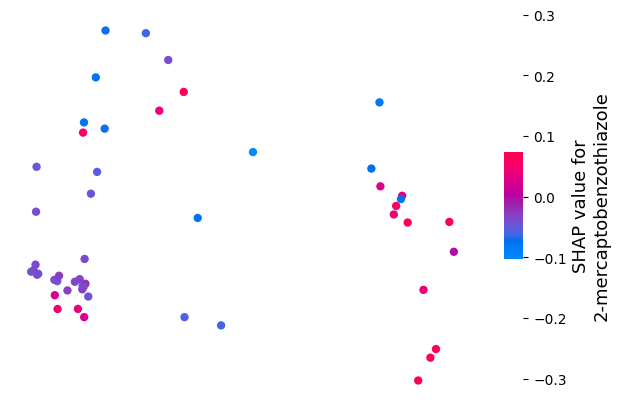

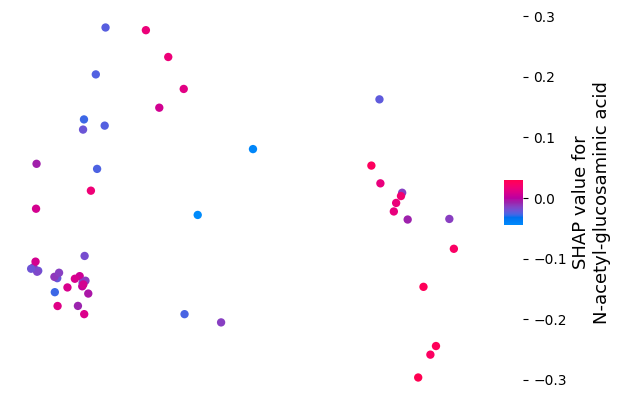

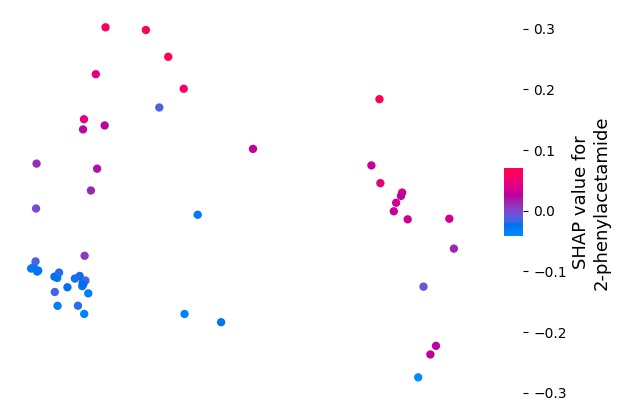

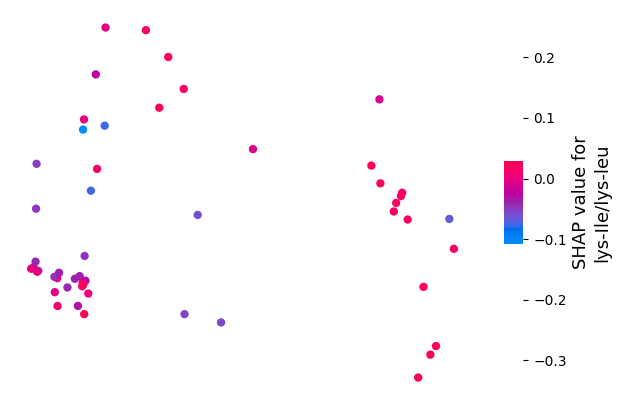

In [58]:
for name in X_test.columns:
  shap.embedding_plot(name, 
                     shap_values[1], 
                     feature_names=X_test.columns)

**SHAP Decision Plot**

Read this computational [essay](https://towardsdatascience.com/introducing-shap-decision-plots-52ed3b4a1cba) for more on decision plots

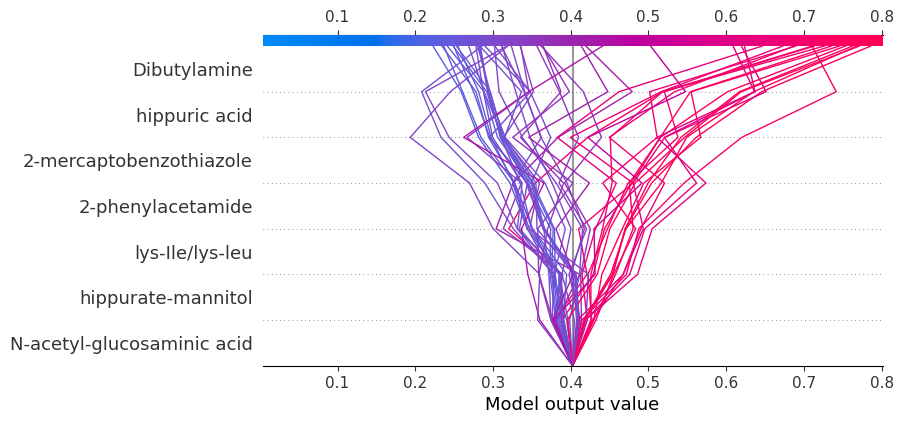

In [59]:
# create a shap decision plot
shap.decision_plot(explainer.expected_value[1], 
                   shap_values[1], 
                   feature_names=list(X_test.columns), 
                   link='identity')

**True Positives and False Negatives**

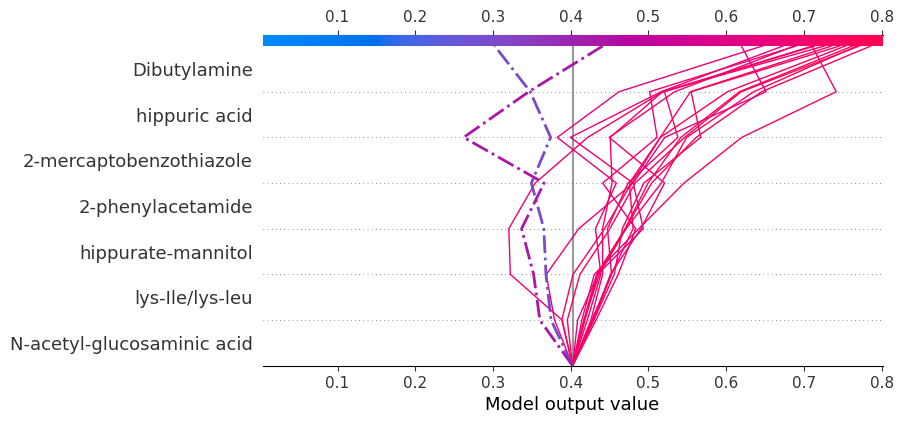

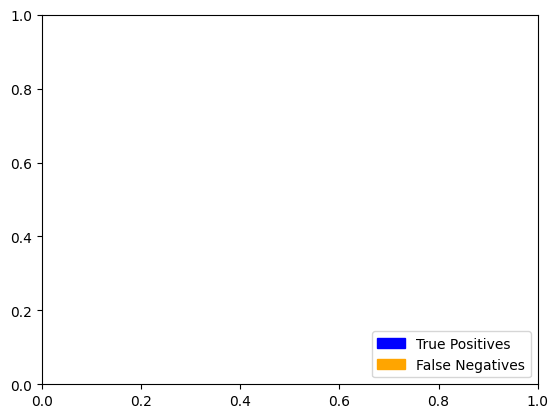

In [78]:
import matplotlib.patches as mpatches

# True Positives
tp_shap_values = np.array([shap_values[1][i] for i in tp_list])
tp_X_test = X_test.iloc[tp_list]

# False Negatives
fn_shap_values = np.array([shap_values[1][i] for i in fn_list])
fn_X_test = X_test.iloc[fn_list]

# Combine the two groups
combined_shap_values = np.vstack([tp_shap_values, fn_shap_values])
combined_X_test = pd.concat([tp_X_test, fn_X_test])

# Highlight the False Negatives
highlight_idx = list(range(len(tp_shap_values), len(tp_shap_values) + len(fn_shap_values)))

shap.decision_plot(explainer.expected_value[1], combined_shap_values, 
                   combined_X_test, link='identity', highlight=highlight_idx);

# Create a custom legend
tp_patch = mpatches.Patch(color='blue', label='True Positives')
fn_patch = mpatches.Patch(color='orange', label='False Negatives')

# Add the legend to the plot
plt.legend(handles=[tp_patch, fn_patch], loc='lower right')

# Save the plot
#plt.savefig("Decision_plot_TP_FN.svg")
#plt.clf()